# Snow extent box plots (as Mudryk paper) and errors calculations

In [2]:
from watermark import watermark
%load_ext watermark
print(watermark())

Last updated: 2025-04-23T08:30:33.681547+00:00

Python implementation: CPython
Python version       : 3.12.8
IPython version      : 8.17.2

Compiler    : GCC 13.3.0
OS          : Linux
Release     : 6.8.0-31-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit



In [4]:
pip install plotly.express

  Using cached plotly_express-0.4.1-py2.py3-none-any.whl.metadata (1.7 kB)
  Using cached plotly-6.0.1-py3-none-any.whl.metadata (6.7 kB)
  Using cached narwhals-1.35.0-py3-none-any.whl.metadata (9.2 kB)
Using cached plotly_express-0.4.1-py2.py3-none-any.whl (2.9 kB)
Using cached plotly-6.0.1-py3-none-any.whl (14.8 MB)
Using cached narwhals-1.35.0-py3-none-any.whl (325 kB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import csv

In [4]:
%watermark --iversions

numpy     : 2.0.2
plotly    : 6.0.1
pandas    : 2.2.3
csv       : 1.0
seaborn   : 0.13.2
watermark : 2.5.0
matplotlib: 3.10.0



## Mes fichiers d'extension mensuelle moyenne de neige pour tous les modèles - Fichiers historiques

In [5]:
# méthode avec fichiers historiques
histo = pd.read_csv('~/private-storage/fichiers_csv/Comparaison entre modèles - avec_glaciers_historical.csv', sep=',')
histo

,modele,janvier,fevrier,mars,avril,mai,juin,juillet,aout,septembre,octobre,novembre,decembre,annuel
0,BCC_CSM2_MR,44398247,44579044,41218745,33115338,21265612,9939081,5109378,4125062,5982161,16174619,28415154,39055434,24448156
1,CESM2,45216181,45051558,39354482,28760522,17296116,8956349,4508116,3205742,5010174,14828405,28077825,38942323,23267316
2,CESM2_WACCM,44828597,45262810,40140563,30244751,18585419,9614280,4681767,3305975,5391869,15439797,27729551,38848351,23672811
3,CIESM,47823967,46445570,40435278,29248961,16692048,5359874,1951317,1509609,2643048,13573818,31006562,43093545,23315300
4,CNRM_CM6_1,55821318,55785478,48562254,33406143,17368459,5657832,3136854,2885529,5029636,17365538,35534535,49134154,27473978
5,CNRM_CM6_1_HR,54244195,54118724,47914149,33321736,17056873,6009407,3486442,3384403,6117203,18748444,36136902,48753303,27440982
6,CNRM_ESM2_1,53699647,53406180,46546059,32661670,16403215,5168239,2816770,2508563,4445376,16225897,33316758,47198218,26199716
7,CanESM5,58062517,59623565,55691147,45558915,30524211,14542138,5275388,3848577,8092316,21919592,38978011,50896300,32751056
8,CanESM5_CanOE,58479372,60074569,56521093,46686006,31272677,15114169,5615691,3793570,8603242,22510331,39815301,51887433,33364455
9,EC_Earth3,60203994,59158476,54685859,46010681,33474673,19651805,7567966,7363320,17358592,35459767,49259992,57938460,37344465


In [6]:
# passage au format long
histo_long = histo.melt(id_vars='modele', var_name='Mois', value_name='snow_extent')
histo_long

,modele,Mois,snow_extent
0,BCC_CSM2_MR,janvier,44398247
1,CESM2,janvier,45216181
2,CESM2_WACCM,janvier,44828597
3,CIESM,janvier,47823967
4,CNRM_CM6_1,janvier,55821318
...,...,...,...
333,MRI_ESM2_0,annuel,25078150
334,NorESM2_LM,annuel,24860880
335,NorESM2_MM,annuel,24918593
336,UKESM1_0_LL,annuel,28276896


In [7]:
ref_data = histo_long[histo_long['modele'] == 'Reference']
ref_data

,modele,Mois,snow_extent
25,Reference,janvier,47527339
51,Reference,fevrier,47170685
77,Reference,mars,41034269
103,Reference,avril,32014146
129,Reference,mai,19553457
155,Reference,juin,9003870
181,Reference,juillet,3134122
207,Reference,aout,2460193
233,Reference,septembre,4226952
259,Reference,octobre,17861365


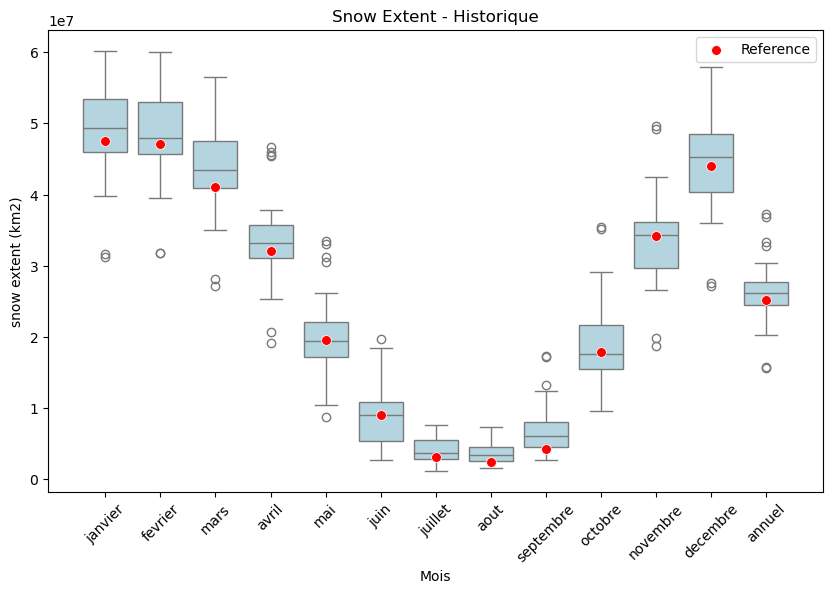

In [61]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Mois', y='snow_extent', data=histo_long, color='lightblue')
sns.scatterplot(x='Mois', y='snow_extent', data=ref_data, color='red', s=50, label='Reference', zorder=10)
plt.title('Snow Extent - Historique')
plt.ylabel('snow extent (km2)')
plt.xticks(rotation=45)
plt.show()

In [9]:
outliers = []

# detection des outliers pour chaque mois
for mois in histo_long['Mois'].unique():
    valeurs = histo_long[histo_long['Mois'] == mois]['snow_extent']
    q1 = valeurs.quantile(0.25)
    q3 = valeurs.quantile(0.75)
    iqr = q3 - q1 #(interquantile range)
    seuil_bas = q1 - 1.5 * iqr
    seuil_haut = q3 + 1.5 * iqr

    # selection des outliers
    outliers_mois = histo_long[
        (histo_long['Mois'] == mois) &
        ((histo_long['snow_extent'] < seuil_bas) | (histo_long['snow_extent'] > seuil_haut))
    ]
    outliers.append(outliers_mois)

outliers_df = pd.concat(outliers)

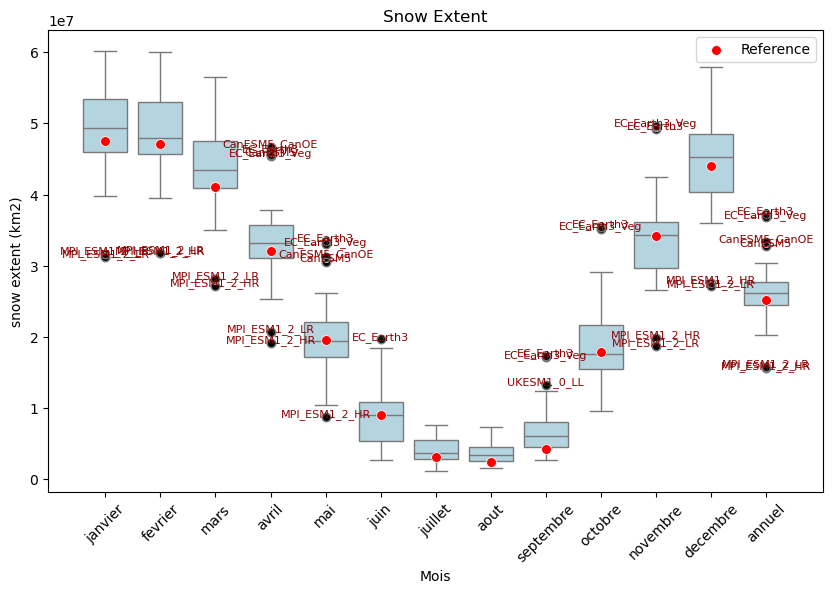

In [10]:
plt.figure(figsize=(10, 6))

#boxplot des valeurs de neige
sns.boxplot(x='Mois', y='snow_extent', data=histo_long, color='lightblue')

#mise en évidence des valeurs de référence
sns.scatterplot(x='Mois', y='snow_extent', data=ref_data, color='red', s=50, label='Reference', zorder=10)

#mise en évidence des outliers
sns.scatterplot(x='Mois', y='snow_extent', data=outliers_df, color='black', s=50)

#ajout des noms des modèles
for i, row in outliers_df.iterrows():
    plt.text(x=row['Mois'], y=row['snow_extent'] + 1, s=row['modele'], horizontalalignment='center',
             fontsize=8, color='darkred')

plt.title('Snow Extent')
plt.ylabel('snow extent (km2)')
plt.xticks(rotation=45)
plt.show()

In [11]:
outliers_df

,modele,Mois,snow_extent
19,MPI_ESM1_2_HR,janvier,31700025
20,MPI_ESM1_2_LR,janvier,31251024
45,MPI_ESM1_2_HR,fevrier,31744757
46,MPI_ESM1_2_LR,fevrier,31813660
71,MPI_ESM1_2_HR,mars,27200100
72,MPI_ESM1_2_LR,mars,28202785
85,CanESM5,avril,45558915
86,CanESM5_CanOE,avril,46686006
87,EC_Earth3,avril,46010681
88,EC_Earth3_Veg,avril,45434067


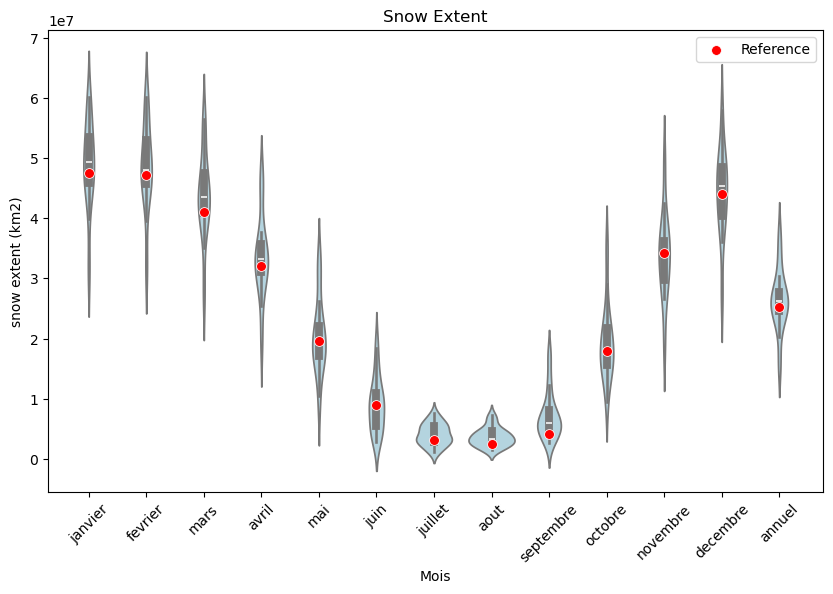

In [12]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Mois', y='snow_extent', data=histo_long, color='lightblue')
sns.scatterplot(x='Mois', y='snow_extent', data=ref_data, color='red', s=50, label='Reference', zorder=10)
plt.title('Snow Extent')
plt.ylabel('snow extent (km2)')
plt.xticks(rotation=45)
plt.show()

## Calcul des erreurs absolues

In [13]:
df_avec_erreur = histo_long.merge(ref_data, on='Mois', how='left')
df_avec_erreur

,modele_x,Mois,snow_extent_x,modele_y,snow_extent_y
0,BCC_CSM2_MR,janvier,44398247,Reference,47527339
1,CESM2,janvier,45216181,Reference,47527339
2,CESM2_WACCM,janvier,44828597,Reference,47527339
3,CIESM,janvier,47823967,Reference,47527339
4,CNRM_CM6_1,janvier,55821318,Reference,47527339
...,...,...,...,...,...
333,MRI_ESM2_0,annuel,25078150,Reference,25179286
334,NorESM2_LM,annuel,24860880,Reference,25179286
335,NorESM2_MM,annuel,24918593,Reference,25179286
336,UKESM1_0_LL,annuel,28276896,Reference,25179286


In [14]:
df_avec_erreur['Erreur_absolue'] = (df_avec_erreur['snow_extent_x'] - df_avec_erreur['snow_extent_y']).abs()

In [15]:
df_avec_erreur

,modele_x,Mois,snow_extent_x,modele_y,snow_extent_y,Erreur_absolue
0,BCC_CSM2_MR,janvier,44398247,Reference,47527339,3129092
1,CESM2,janvier,45216181,Reference,47527339,2311158
2,CESM2_WACCM,janvier,44828597,Reference,47527339,2698742
3,CIESM,janvier,47823967,Reference,47527339,296628
4,CNRM_CM6_1,janvier,55821318,Reference,47527339,8293979
...,...,...,...,...,...,...
333,MRI_ESM2_0,annuel,25078150,Reference,25179286,101136
334,NorESM2_LM,annuel,24860880,Reference,25179286,318406
335,NorESM2_MM,annuel,24918593,Reference,25179286,260693
336,UKESM1_0_LL,annuel,28276896,Reference,25179286,3097610


### Visualisation sous forme de courbes

In [54]:
fig = px.line(
    df_avec_erreur[df_avec_erreur['modele_x'] != 'Reference'],
    x='Mois', y='Erreur_absolue', color='modele_x', markers=True, title="Erreur absolue par modèle et par mois - Historique")
fig.show()

### Visualisation sous forme de heat map

In [17]:
# je force l'ordre des mois, sinon classe par ordre alphabétique
ordre_mois = ['janvier', 'fevrier', 'mars', 'avril', 'mai', 'juin', 'juillet', 'aout', 
              'septembre', 'octobre', 'novembre', 'decembre', 'annuel']

# je réorganise mes données de format long à large
df_pivot_absolu = df_avec_erreur[df_avec_erreur['modele_x'] !='Reference'].pivot(index='modele_x', columns='Mois', values='Erreur_absolue')
df_pivot_absolu = df_pivot_absolu[ordre_mois]

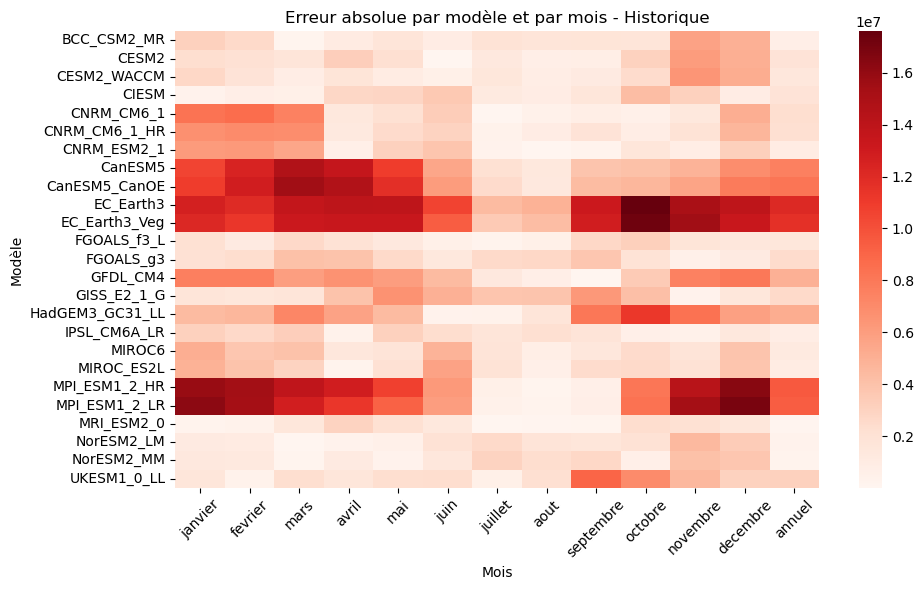

In [49]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_pivot_absolu, annot=False, cmap='Reds') #annot Flase comme ça les valeurs ne s'affichent pas dedans 
plt.title("Erreur absolue par modèle et par mois - Historique")
plt.xlabel("Mois")
plt.ylabel("Modèle")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Calcul des erreurs relatives

In [19]:
df_avec_erreur['Erreur_relative'] = (((df_avec_erreur['snow_extent_x'] - df_avec_erreur['snow_extent_y'])/df_avec_erreur['snow_extent_y'])*100).abs()

### Visualisation sous forme de courbes

In [53]:
fig = px.line(
    df_avec_erreur[df_avec_erreur['modele_x'] != 'Reference'],
    x='Mois', y='Erreur_relative', color='modele_x', markers=True, title="Erreur relative par modèle et par mois - Historique")
fig.show()

### Visualisation sous forme de heatmap

In [21]:
# je réorganise mes données de format long à large
df_pivot_relative = df_avec_erreur[df_avec_erreur['modele_x'] !='Reference'].pivot(index='modele_x', columns='Mois', values='Erreur_relative')
df_pivot_relative = df_pivot_relative[ordre_mois]

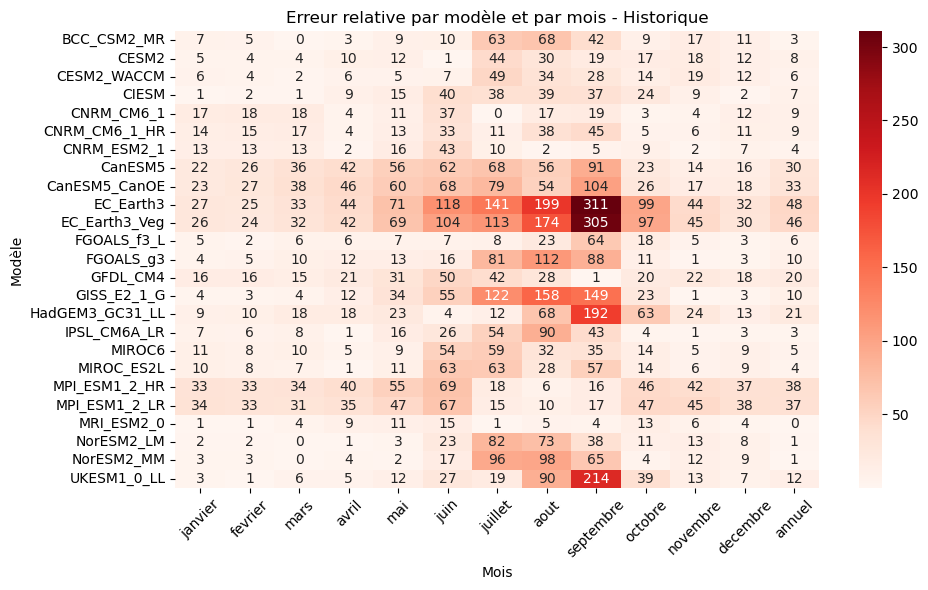

In [60]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_pivot_relative, annot=True, fmt=".0f", cmap='Reds') #annot Flase comme ça les valeurs ne s'affichent pas dedans 
plt.title("Erreur relative par modèle et par mois - Historique")
plt.xlabel("Mois")
plt.ylabel("Modèle")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Mes fichiers d'extension mensuelle moyenne de neige pour tous les modèles - Fichiers SnowWarming

In [23]:
snow_warming = pd.read_csv('~/private-storage/fichiers_csv/Comparaison entre modèles - avec_glaciers_limit_0.85.csv', sep=',')
snow_warming

,modele,janvier,fevrier,mars,avril,mai,juin,juillet,aout,septembre,octobre,novembre,decembre,annuel
0,BCC_CSM2_MR,42820337,43506155,40242590,31018373,19273776,9230727,4905885,3883732,5442793,15388071,28036372,37542357,23440931
1,CESM2,44441224,44303073,38760290,27843785,16688623,8468683,4131119,3058190,4607454,14574569,27561326,38470229,22742380
2,CESM2_WACCM,44372195,44545269,39385001,29729306,18333683,9406806,4593435,3267960,5355191,15187748,27914089,38774870,23405463
3,CIESM,48554742,46809480,40406271,29348748,16410637,5401579,1965937,1541245,2931784,14430407,32289423,43723542,23651150
4,CNRM_CM6_1,55385815,55292975,48114923,32765848,16906707,5609524,3122609,2854806,4981037,17203586,35258584,48764683,27188425
5,CNRM_CM6_1_HR,54455404,54284557,48001281,33396804,17200663,6172689,3583150,3509893,6503774,19552980,36890031,49348237,27741622
6,CNRM_ESM2_1,53031816,52996222,45995935,31714825,15362010,4934792,2715880,2415117,4199707,15212909,32480653,46552703,25634381
7,CanESM5,58686140,60365354,55752728,46274387,31407195,15099505,5943405,4540608,9315558,23199453,40493434,52165655,33603619
8,CanESM5_CanOE,59697136,61523222,57879523,47609188,32521186,17210160,6972657,4918940,10469055,25490109,41579296,53050276,34910062
9,EC_Earth3,59824199,58909831,54243769,45313421,32313120,18858780,6883555,7033575,16972358,34702980,48716303,57676830,36787393


In [24]:
# passage au format long
snow_warming_long = snow_warming.melt(id_vars='modele', var_name='Mois', value_name='snow_extent')
snow_warming_long

,modele,Mois,snow_extent
0,BCC_CSM2_MR,janvier,42820337
1,CESM2,janvier,44441224
2,CESM2_WACCM,janvier,44372195
3,CIESM,janvier,48554742
4,CNRM_CM6_1,janvier,55385815
...,...,...,...
333,MRI_ESM2_0,annuel,24280893
334,NorESM2_LM,annuel,23811197
335,NorESM2_MM,annuel,23952070
336,UKESM1_0_LL,annuel,27524830


In [25]:
# extraction de la référence du fichier long
ref_data_SW = snow_warming_long[snow_warming_long['modele'] == 'Reference']
ref_data_SW

,modele,Mois,snow_extent
25,Reference,janvier,47527339
51,Reference,fevrier,47170685
77,Reference,mars,41034269
103,Reference,avril,32014146
129,Reference,mai,19553457
155,Reference,juin,9003870
181,Reference,juillet,3134122
207,Reference,aout,2460193
233,Reference,septembre,4226952
259,Reference,octobre,17861365


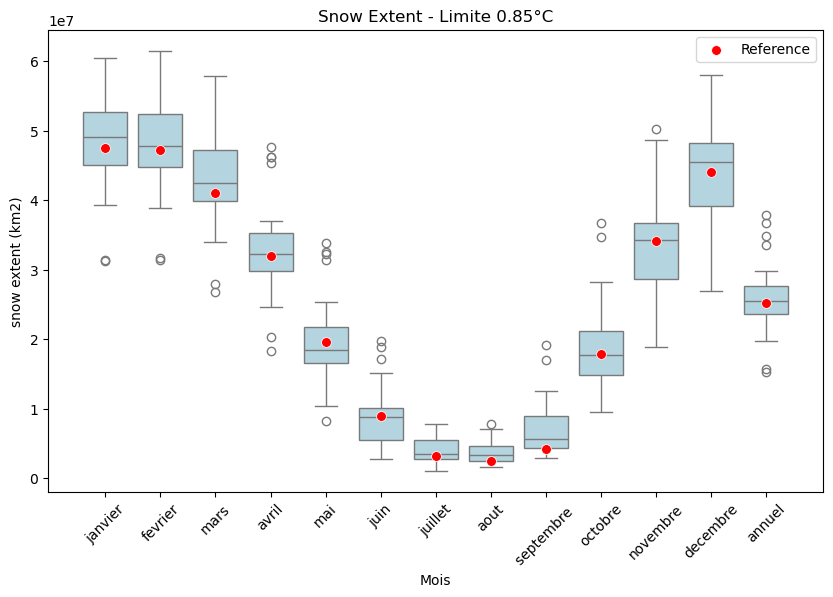

In [59]:
# création d'un boxplot des valeurs de couverture neigeuse mensuelles moyennes
plt.figure(figsize=(10, 6))
sns.boxplot(x='Mois', y='snow_extent', data=snow_warming_long, color='lightblue')
sns.scatterplot(x='Mois', y='snow_extent', data=ref_data_SW, color='red', s=50, label='Reference', zorder=10) # je mets en évidence les données de référence
plt.title('Snow Extent - Limite 0.85°C')
plt.ylabel('snow extent (km2)')
plt.xticks(rotation=45)
plt.show()

In [27]:
outliers_SW = []

# detection des outliers pour chaque mois
for mois in snow_warming_long['Mois'].unique():
    valeurs = snow_warming_long[snow_warming_long['Mois'] == mois]['snow_extent']
    q1 = valeurs.quantile(0.25)
    q3 = valeurs.quantile(0.75)
    iqr = q3 - q1 #(interquantile range)
    seuil_bas = q1 - 1.5 * iqr
    seuil_haut = q3 + 1.5 * iqr

    # selection des outliers
    outliers_mois = snow_warming_long[
        (snow_warming_long['Mois'] == mois) &
        ((snow_warming_long['snow_extent'] < seuil_bas) | (snow_warming_long['snow_extent'] > seuil_haut))
    ]
    outliers_SW.append(outliers_mois)

outliers_SW = pd.concat(outliers_SW)

In [28]:
outliers_SW

,modele,Mois,snow_extent
19,MPI_ESM1_2_HR,janvier,31454066
20,MPI_ESM1_2_LR,janvier,31246344
45,MPI_ESM1_2_HR,fevrier,31465685
46,MPI_ESM1_2_LR,fevrier,31695454
71,MPI_ESM1_2_HR,mars,26841750
72,MPI_ESM1_2_LR,mars,27966861
85,CanESM5,avril,46274387
86,CanESM5_CanOE,avril,47609188
87,EC_Earth3,avril,45313421
88,EC_Earth3_Veg,avril,46206325


## Calcul des erreurs absolues

In [29]:
snow_warming_avec_erreur = snow_warming_long.merge(ref_data_SW, on='Mois', how='left')
snow_warming_avec_erreur

,modele_x,Mois,snow_extent_x,modele_y,snow_extent_y
0,BCC_CSM2_MR,janvier,42820337,Reference,47527339
1,CESM2,janvier,44441224,Reference,47527339
2,CESM2_WACCM,janvier,44372195,Reference,47527339
3,CIESM,janvier,48554742,Reference,47527339
4,CNRM_CM6_1,janvier,55385815,Reference,47527339
...,...,...,...,...,...
333,MRI_ESM2_0,annuel,24280893,Reference,25179286
334,NorESM2_LM,annuel,23811197,Reference,25179286
335,NorESM2_MM,annuel,23952070,Reference,25179286
336,UKESM1_0_LL,annuel,27524830,Reference,25179286


In [30]:
snow_warming_avec_erreur['Erreur_absolue'] = (snow_warming_avec_erreur['snow_extent_x'] - snow_warming_avec_erreur['snow_extent_y']).abs()

### Visualisation sous forme de courbe

In [52]:
fig = px.line(
    snow_warming_avec_erreur[snow_warming_avec_erreur['modele_x'] != 'Reference'],
    x='Mois', y='Erreur_absolue', color='modele_x', markers=True, title="Erreur absolue par modèle et par mois - Limite 0.85°C")
fig.show()

In [32]:
snow_warming_avec_erreur

,modele_x,Mois,snow_extent_x,modele_y,snow_extent_y,Erreur_absolue
0,BCC_CSM2_MR,janvier,42820337,Reference,47527339,4707002
1,CESM2,janvier,44441224,Reference,47527339,3086115
2,CESM2_WACCM,janvier,44372195,Reference,47527339,3155144
3,CIESM,janvier,48554742,Reference,47527339,1027403
4,CNRM_CM6_1,janvier,55385815,Reference,47527339,7858476
...,...,...,...,...,...,...
333,MRI_ESM2_0,annuel,24280893,Reference,25179286,898393
334,NorESM2_LM,annuel,23811197,Reference,25179286,1368089
335,NorESM2_MM,annuel,23952070,Reference,25179286,1227216
336,UKESM1_0_LL,annuel,27524830,Reference,25179286,2345544


In [55]:
ordre_mois_SW = ['janvier', 'fevrier', 'mars', 'avril', 'mai', 'juin', 'juillet', 'aout', 'septembre ', 'octobre', 'novembre', 'decembre', 'annuel']

# je réorganise mes données de format long à large
snow_warming_pivot_absolu = snow_warming_avec_erreur[snow_warming_avec_erreur['modele_x'] !='Reference'].pivot(index='modele_x', columns='Mois', values='Erreur_absolue')
snow_warming_pivot_absolu = snow_warming_pivot_absolu[ordre_mois_SW]

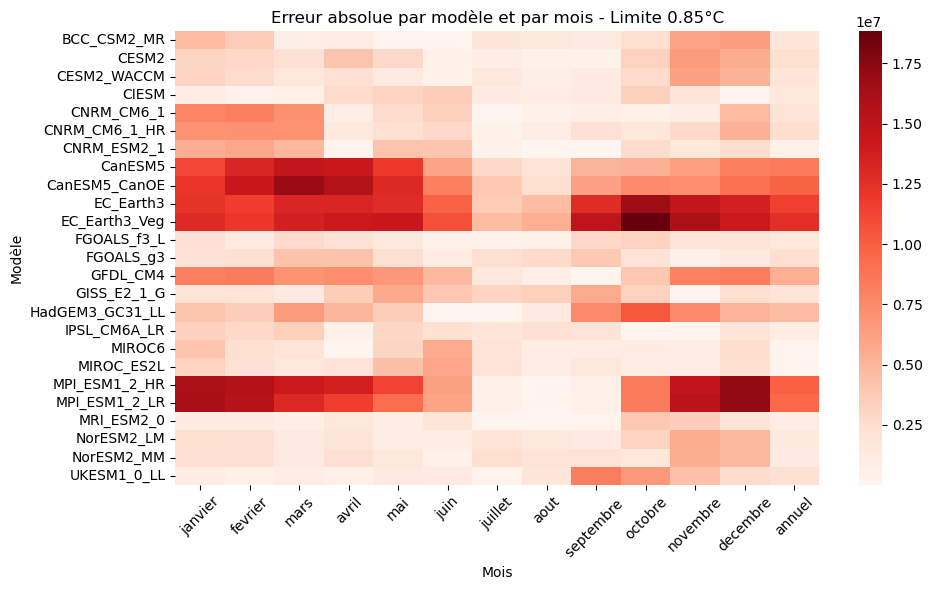

In [56]:
plt.figure(figsize=(10, 6))
sns.heatmap(snow_warming_pivot_absolu, annot=False, cmap='Reds') #annot Flase comme ça les valeurs ne s'affichent pas dedans 
plt.title("Erreur absolue par modèle et par mois - Limite 0.85°C")
plt.xlabel("Mois")
plt.ylabel("Modèle")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Calcul des erreurs relatives

In [50]:
snow_warming_avec_erreur['Erreur_relative'] = (((snow_warming_avec_erreur['snow_extent_x'] - snow_warming_avec_erreur['snow_extent_y'])/snow_warming_avec_erreur['snow_extent_y'])*100).abs()

### Visualisation sous forme de courbe

In [51]:
fig = px.line(
    snow_warming_avec_erreur[snow_warming_avec_erreur['modele_x'] != 'Reference'],
    x='Mois', y='Erreur_relative', color='modele_x', markers=True, title="Erreur relative par modèle et par mois - Limite 0.85°C")
fig.show()

### Visualisation sous forme de heatmap

In [57]:
# je réorganise mes données de format long à large
snow_warming_pivot_relative = snow_warming_avec_erreur[snow_warming_avec_erreur['modele_x'] !='Reference'].pivot(index='modele_x', columns='Mois', values='Erreur_relative')
snow_warming_pivot_relative = snow_warming_pivot_relative[ordre_mois_SW]

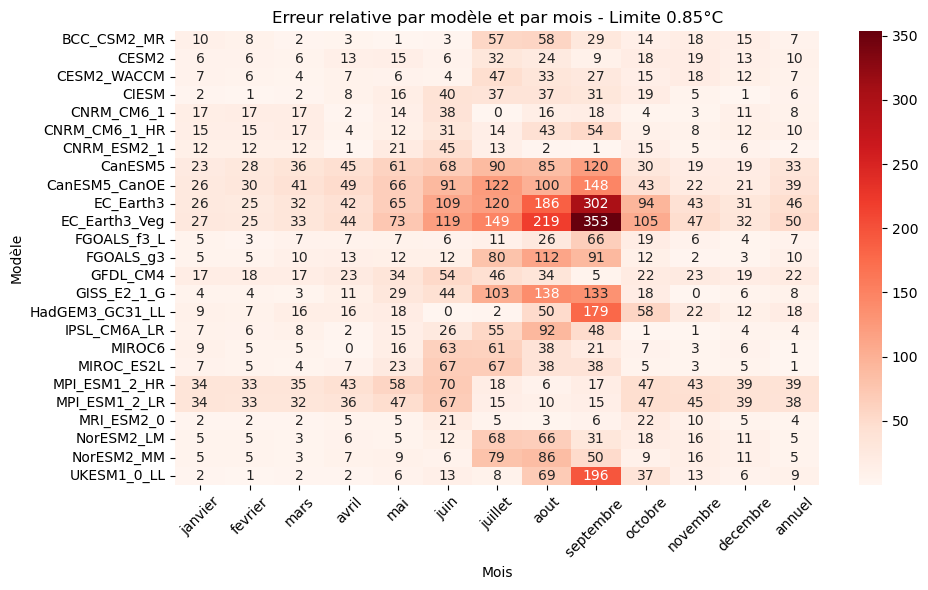

In [58]:
plt.figure(figsize=(10, 6))
sns.heatmap(snow_warming_pivot_relative, annot=True, fmt=".0f", cmap='Reds') #annot true pour avoir %age affiché
plt.title("Erreur relative par modèle et par mois - Limite 0.85°C")
plt.xlabel("Mois")
plt.ylabel("Modèle")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()